Code of the algorithm described in: "Merging gated Frequency-Modulated Continuous-Wave Mars2020 RIMFAX GPR data"

In [1]:
#import
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os
plt.rcParams.update({'font.size': 28})

In [2]:
#path for data and model save
data_path = 'data/'
model_path = 'model/'
#load the data: data has shape: [n_trace, samples per trace, n_frequency]
data_full  = np.load(data_path + 'RIMFAX_test.npy')
#number of available frequency to merge
n_frequency = data_full.shape[-1]

print('Data loaded wit: \n    - number of traces: ' + str(data_full.shape[0]) + '\n    - number of sample per trace: ' + str(data_full.shape[1]) + '\n    - number of frequency: ' + str(n_frequency))

Data loaded wit: 
    - number of traces: 900
    - number of sample per trace: 3500
    - number of frequency: 3


Text(0.5, 1.0, 'Deep')

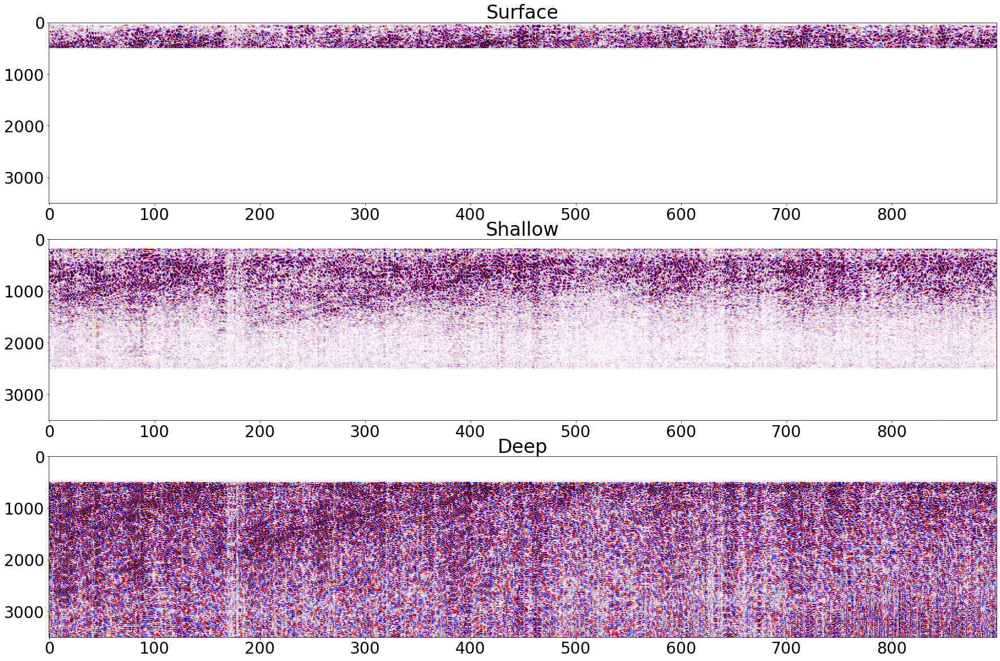

In [6]:
plt.figure(figsize=[30, 20])
plt.subplot(311)
plt.imshow(data_full[:, :, 0].T, aspect = 'auto', cmap = 'seismic', vmin = -.1, vmax = .1)
plt.title('Surface')
plt.subplot(312)
plt.imshow(data_full[:, :, 1].T, aspect = 'auto', cmap = 'seismic', vmin = -.1, vmax = .1)
plt.title('Shallow')
plt.subplot(313)
plt.imshow(data_full[:, :, 2].T, aspect = 'auto', cmap = 'seismic', vmin = -.1, vmax = .1)
plt.title('Deep')

In [7]:
#define thersholds
#thershold_* is a list with [start, end]
thershold_surface = [0,    500]
thershold_shallow = [250, 1250]
thershold_deep    = [500, data_full.shape[1]]

Text(0.5, 1.0, 'Deep')

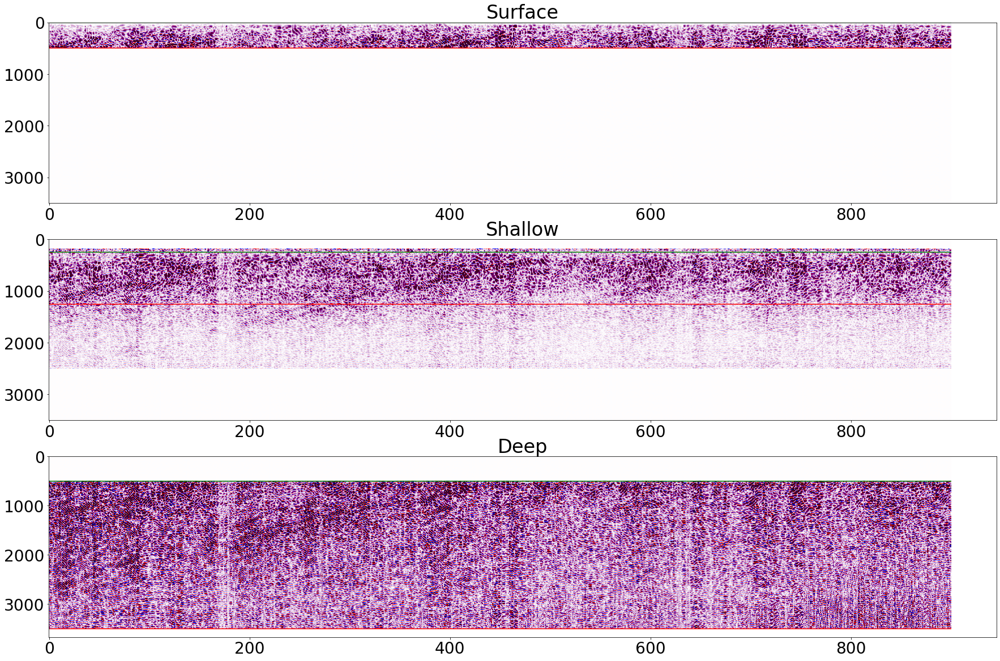

In [8]:
#look at the thershold choosen
plt.figure(figsize=[30, 20])
plt.subplot(311)
plt.imshow(data_full[:, :, 0].T, aspect = 'auto', cmap = 'seismic', vmin = -.1, vmax = .1)
plt.hlines(thershold_surface, 0, data_full.shape[0], colors=['g', 'r'])
plt.title('Surface')
plt.subplot(312)
plt.imshow(data_full[:, :, 1].T, aspect = 'auto', cmap = 'seismic', vmin = -.1, vmax = .1)
plt.hlines(thershold_shallow, 0, data_full.shape[0], colors=['g', 'r'])
plt.title('Shallow')
plt.subplot(313)
plt.imshow(data_full[:, :, 2].T, aspect = 'auto', cmap = 'seismic', vmin = -.1, vmax = .1)
plt.hlines(thershold_deep, 0, data_full.shape[0], colors=['g', 'r'])
plt.title('Deep')

In [13]:
#define custom loss function
def custom_loss_function(y_true, y_pred):
  squared_difference_1 = tf.square(y_true[:, thershold_surface[0]:thershold_surface[1], 0] - y_pred[:, thershold_surface[0]:thershold_surface[1], 0])
  squared_difference_2 = tf.square(y_true[:, thershold_shallow[0]:thershold_shallow[1], 1] - y_pred[:, thershold_shallow[0]:thershold_shallow[1], 0])
  squared_difference_3 = tf.square(y_true[:, thershold_deep[0]:thershold_deep[1], 2] - y_pred[:, thershold_deep[0]:thershold_deep[1], 0])
  return tf.reduce_mean(squared_difference_1, axis=-1) + tf.reduce_mean(squared_difference_2, axis=-1) + tf.reduce_mean(squared_difference_3, axis=-1)

In [14]:
#create tf model
#input of shape [batch, None, n_frequency]
inputs = tf.keras.Input(shape=(None, n_frequency))

#1st bi-directional layer
forward_layer = tf.keras.layers.LSTM(4, return_sequences=True)
backward_layer = tf.keras.layers.LSTM(4, return_sequences=True, go_backwards=True)
v0 = tf.keras.layers.Bidirectional(forward_layer, backward_layer=backward_layer)(inputs)

#2nd bi-directional layer
forward_layer = tf.keras.layers.LSTM(2, return_sequences=True)
backward_layer = tf.keras.layers.LSTM(2, return_sequences=True, go_backwards=True)
v1 = tf.keras.layers.Bidirectional(forward_layer, backward_layer=backward_layer)(v0)

#3rd bi-directional layer
forward_layer = tf.keras.layers.LSTM(1, return_sequences=True)
backward_layer = tf.keras.layers.LSTM(1, return_sequences=True, go_backwards=True)
v2 = tf.keras.layers.Bidirectional(forward_layer, backward_layer=backward_layer)(v1)

#output layer
v_final = tf.keras.layers.LSTM(1, return_sequences= True)(v2)

#create the model
model = tf.keras.Model(inputs=[inputs], outputs=[v_final])

#compile the model with custom loss function
model.compile(optimizer=tf.keras.optimizers.Adamax(learning_rate=0.01), loss = custom_loss_function)

print(model.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, 3)]         0         
                                                                 
 bidirectional_3 (Bidirectio  (None, None, 8)          256       
 nal)                                                            
                                                                 
 bidirectional_4 (Bidirectio  (None, None, 4)          176       
 nal)                                                            
                                                                 
 bidirectional_5 (Bidirectio  (None, None, 2)          48        
 nal)                                                            
                                                                 
 lstm_13 (LSTM)              (None, None, 1)           16        
                                                           

In [15]:
#take 25% of the data (just for faster training)
X_train  = data_full[::4, :, :]

In [16]:
#fit the model
history = model.fit(X_train, X_train, epochs = 200, batch_size = 1024, verbose=1)

Epoch 1/200
1/1 [==============================] - 10s 10s/step - loss: 0.0269
Epoch 2/200
1/1 [==============================] - 1s 599ms/step - loss: 0.0270
Epoch 3/200
1/1 [==============================] - 1s 605ms/step - loss: 0.0256
Epoch 4/200
1/1 [==============================] - 1s 600ms/step - loss: 0.0250
Epoch 5/200
1/1 [==============================] - 1s 582ms/step - loss: 0.0248
Epoch 6/200
1/1 [==============================] - 1s 594ms/step - loss: 0.0245
Epoch 7/200
1/1 [==============================] - 1s 601ms/step - loss: 0.0240
Epoch 8/200
1/1 [==============================] - 1s 590ms/step - loss: 0.0235
Epoch 9/200
1/1 [==============================] - 1s 590ms/step - loss: 0.0230
Epoch 10/200
1/1 [==============================] - 1s 588ms/step - loss: 0.0226
Epoch 11/200
1/1 [==============================] - 1s 590ms/step - loss: 0.0222
Epoch 12/200
1/1 [==============================] - 1s 585ms/step - loss: 0.0217
Epoch 13/200
1/1 [====================

In [17]:
#save model and loss
np.save(model_path    + 'loss_training', history.history['loss'])
model.save(model_path + 'model_final')

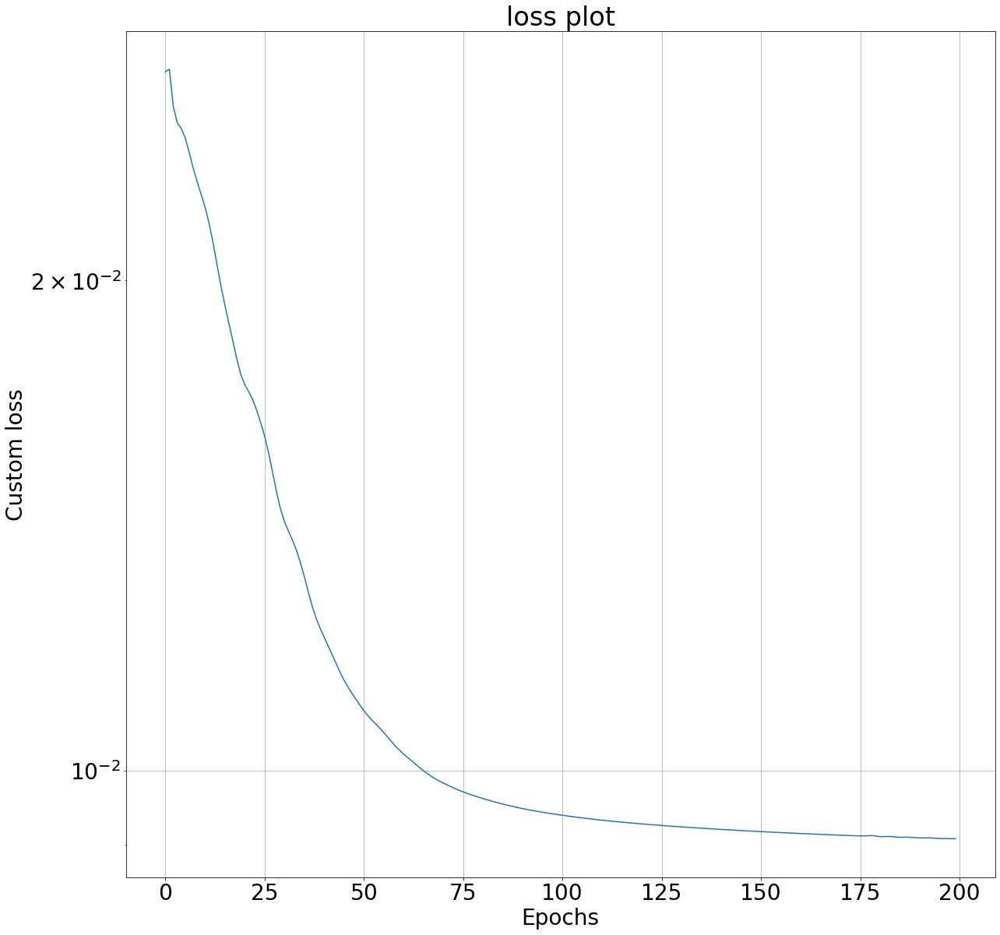

In [21]:
#plot the loss
plt.figure(figsize=[20, 20])
plt.semilogy(history.history['loss'])
plt.title('loss plot')
plt.xlabel('Epochs')
plt.ylabel('Custom loss')
plt.grid(True)

In [19]:
#predict the whole model
y_pred = model.predict(data_full, verbose = 1, batch_size=1024)

1/1 [==============================] - 2s 2s/step


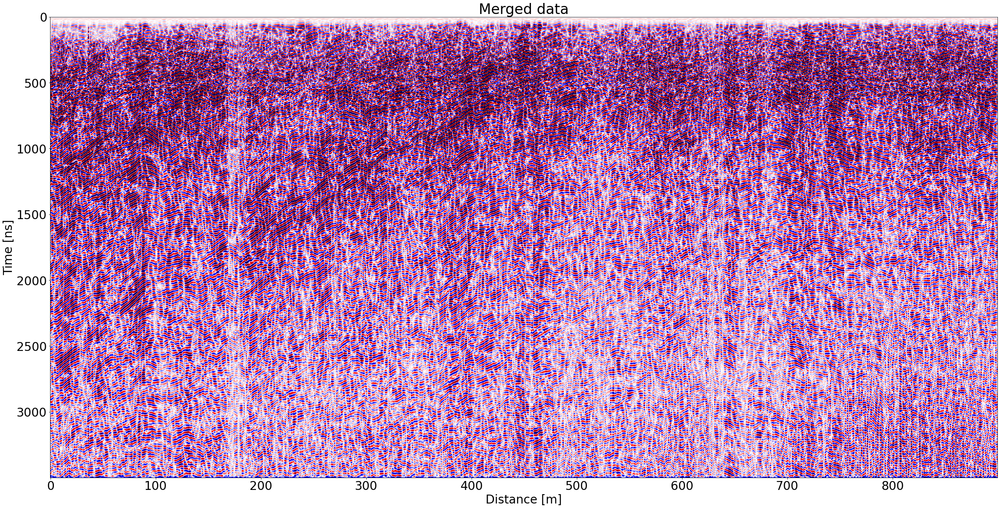

In [20]:
plt.figure(figsize=[40, 20])
plt.title('Merged data')
plt.xlabel('Distance [m]')
plt.ylabel('Time [ns]')
plt.imshow(y_pred[:, :, 0].T, aspect='auto', cmap='seismic', vmin =-.1, vmax =.1)